In [31]:
import cv2
import utils
from skew_corrector import ImageSkewCorrector

## Open Image

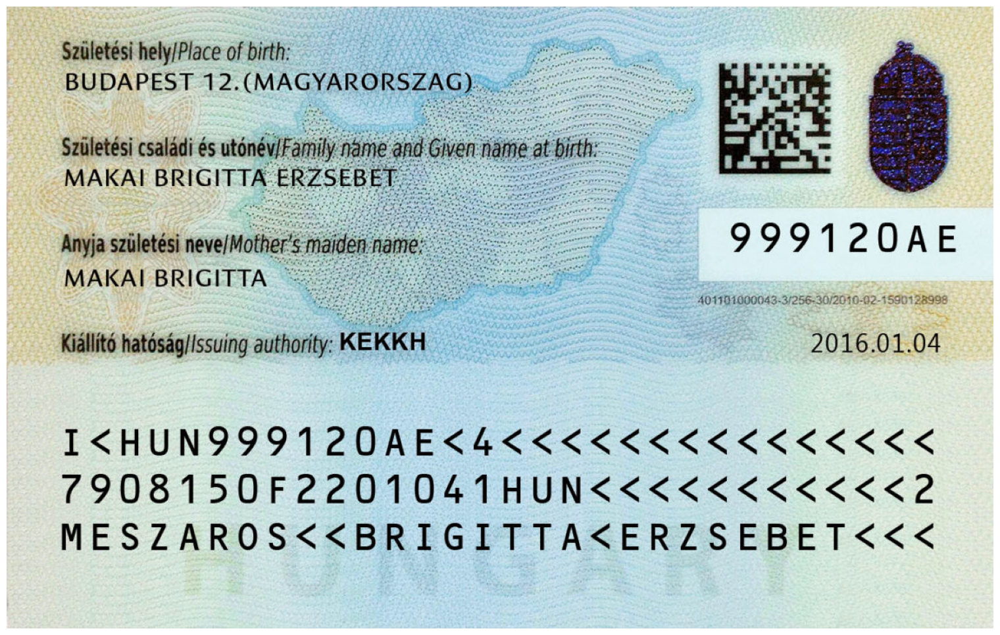

In [23]:
IMAGE_FILE = "./assets/id_card.jpg"

img = cv2.imread(IMAGE_FILE)
utils.display(img)

## Invert images

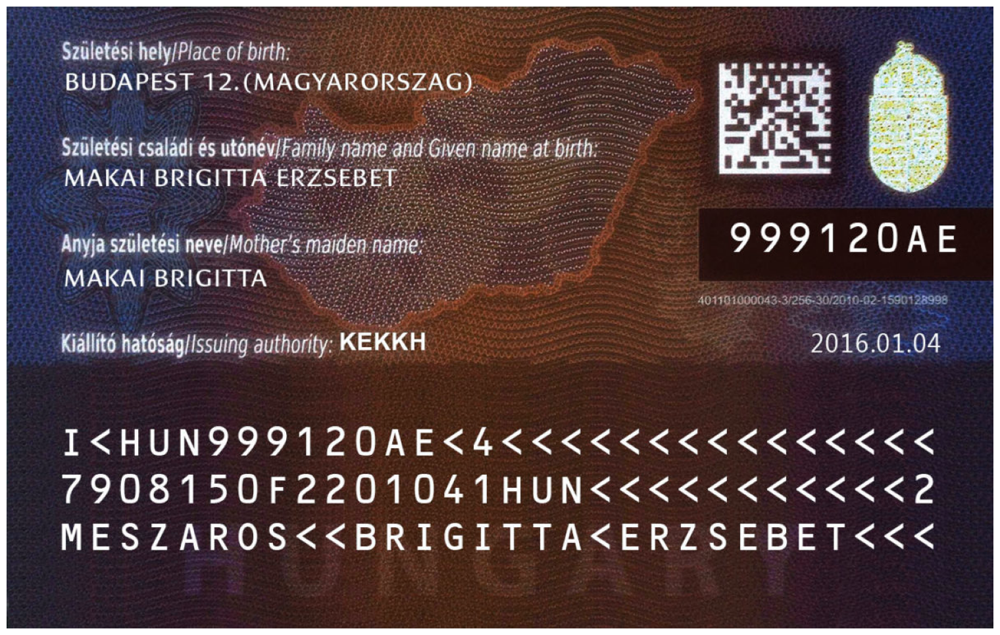

In [24]:
inverted_img = cv2.bitwise_not(img)
cv2.imwrite("assets/inverted.jpg", inverted_img)
utils.display(inverted_img)

## Binarization

In [25]:
def grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

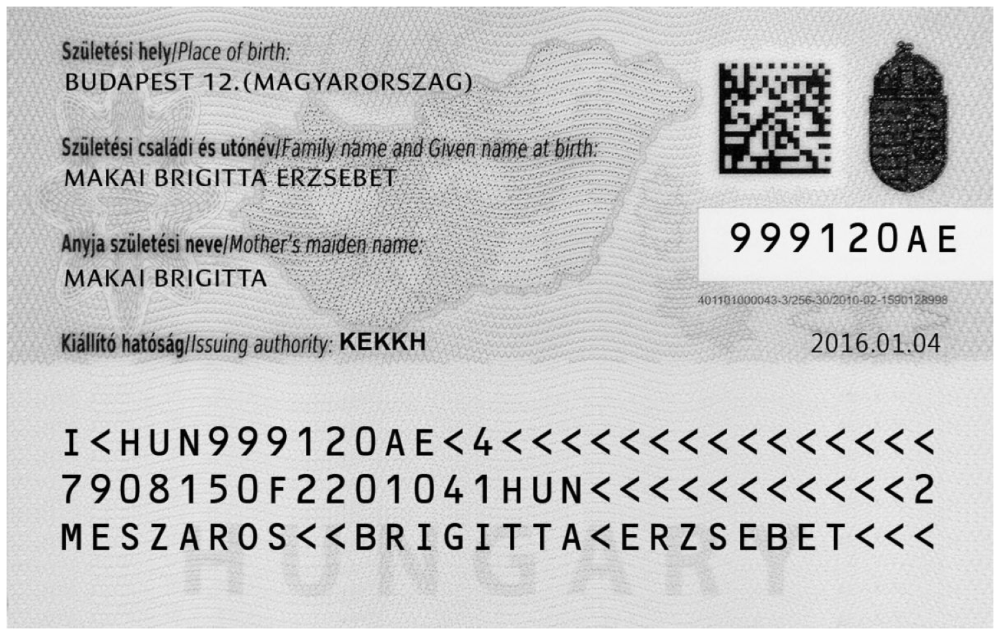

In [26]:
gray_image = grayscale(img)
cv2.imwrite("assets/gray.jpg", gray_image)
utils.display(gray_image)

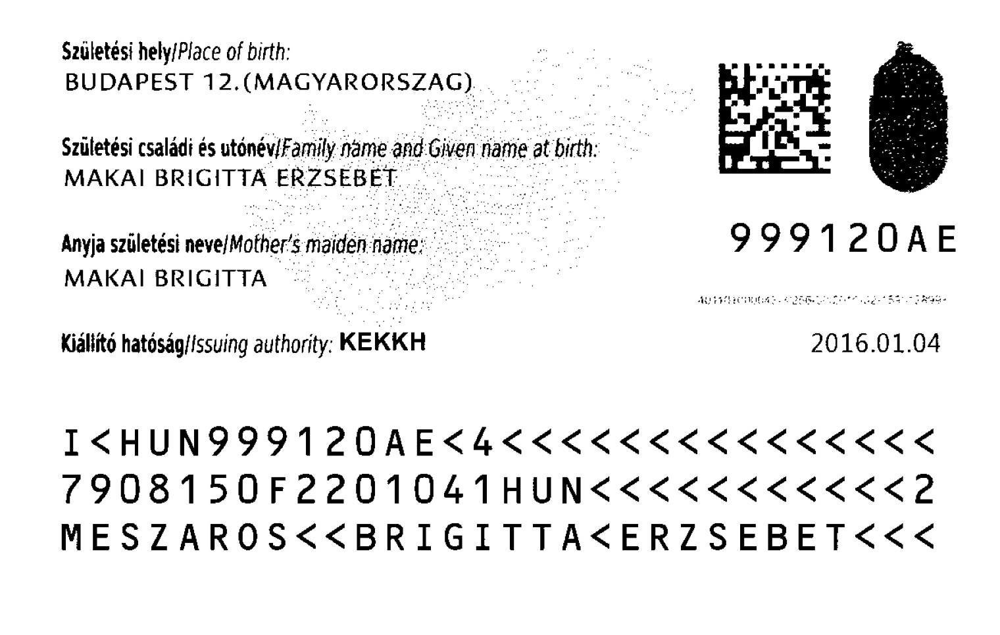

In [27]:
thresh, im_bw = cv2.threshold(gray_image, 110, 230, cv2.THRESH_BINARY)
utils.display(im_bw)

## Noise Removal

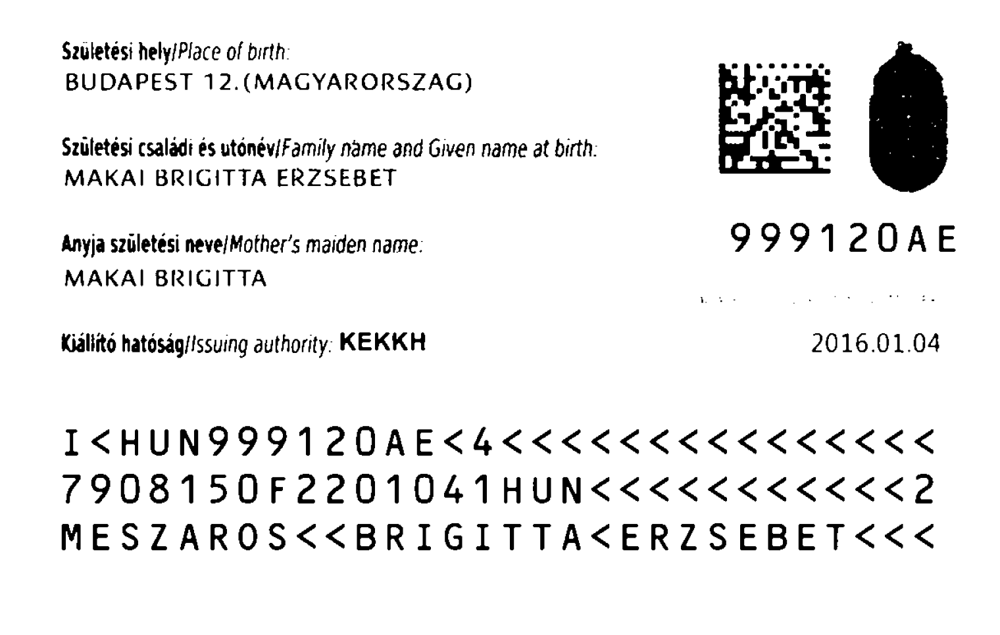

In [28]:
no_noise = utils.noise_removal(im_bw, blur=3)
cv2.imwrite("./assets/no_noise.jpg", no_noise)
utils.display(no_noise)

## Dilation and Erosion

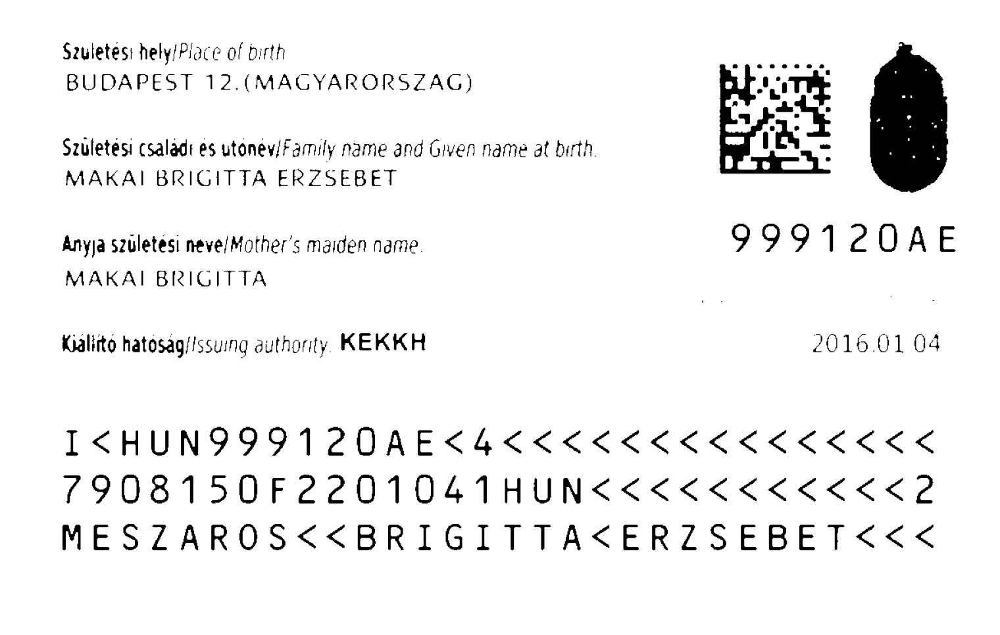

In [29]:
eroded_image = utils.thin_font(no_noise, kernel=(2, 2))
utils.display(eroded_image)

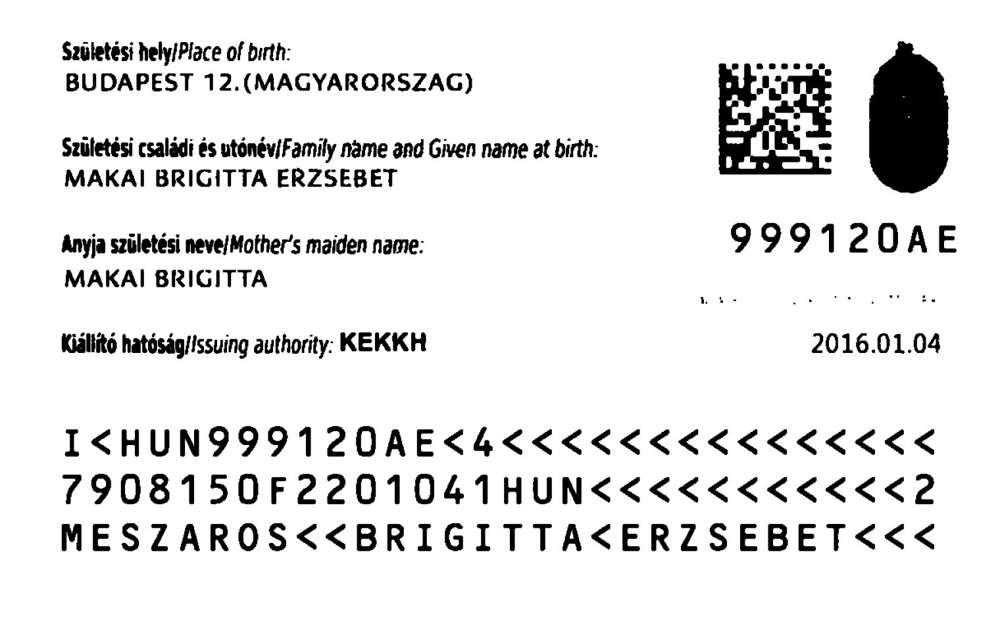

In [30]:
dilated_image = utils.thick_font(no_noise)
cv2.imwrite("assets/dilated.jpg", dilated_image)
utils.display(dilated_image)

## Rotation / Deskewing

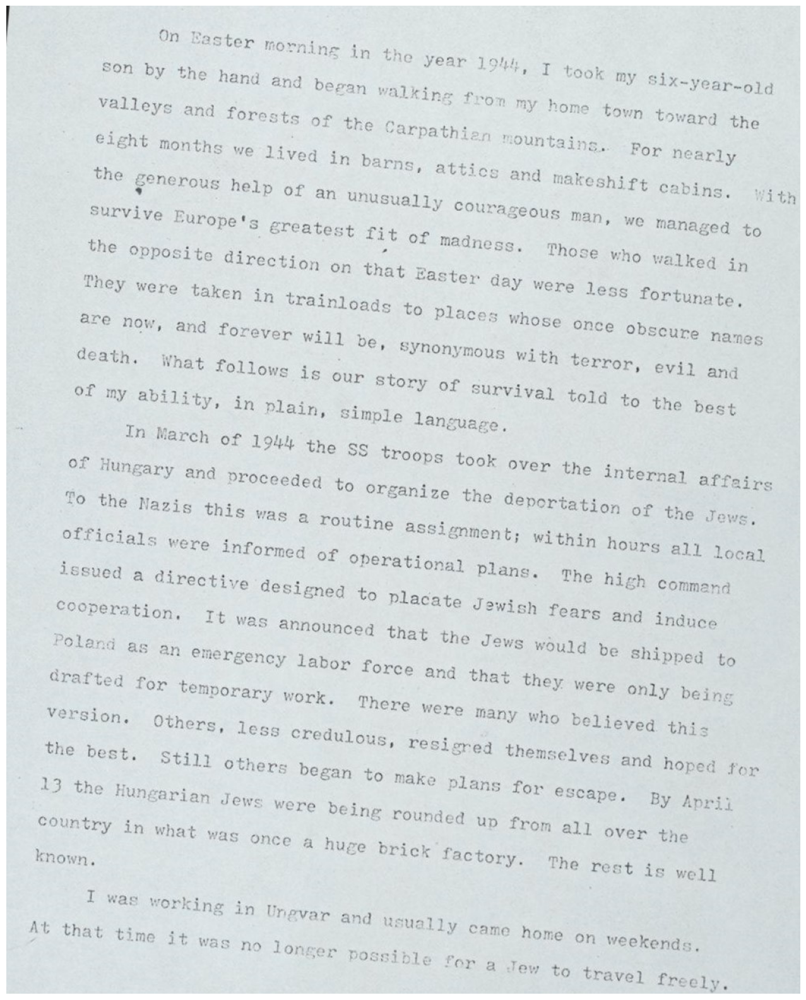

In [19]:
page_img = cv2.imread("assets/page_01_rotated.JPG")
utils.display(page_img)

In [20]:
fixed = utils.deskew(page_img)

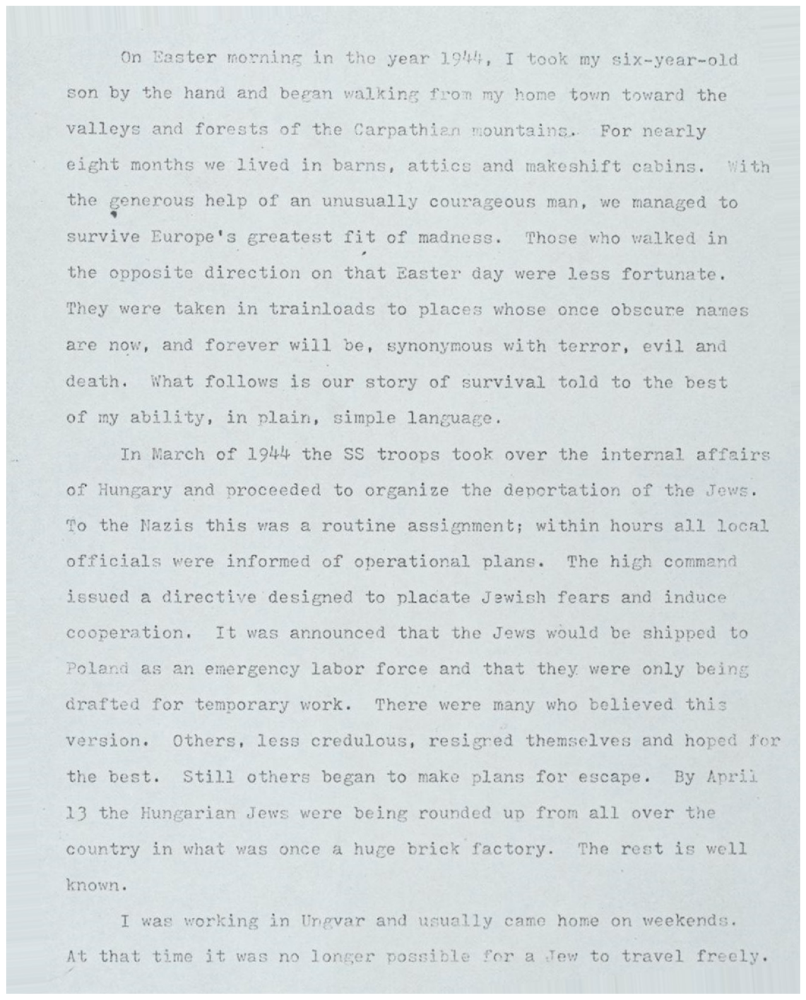

In [21]:
utils.display(fixed)

Speed optimized skew corrector

In [35]:
fixed, angle = ImageSkewCorrector().correct_skew(page_img, limit=30, delta=1)

Angle: 5


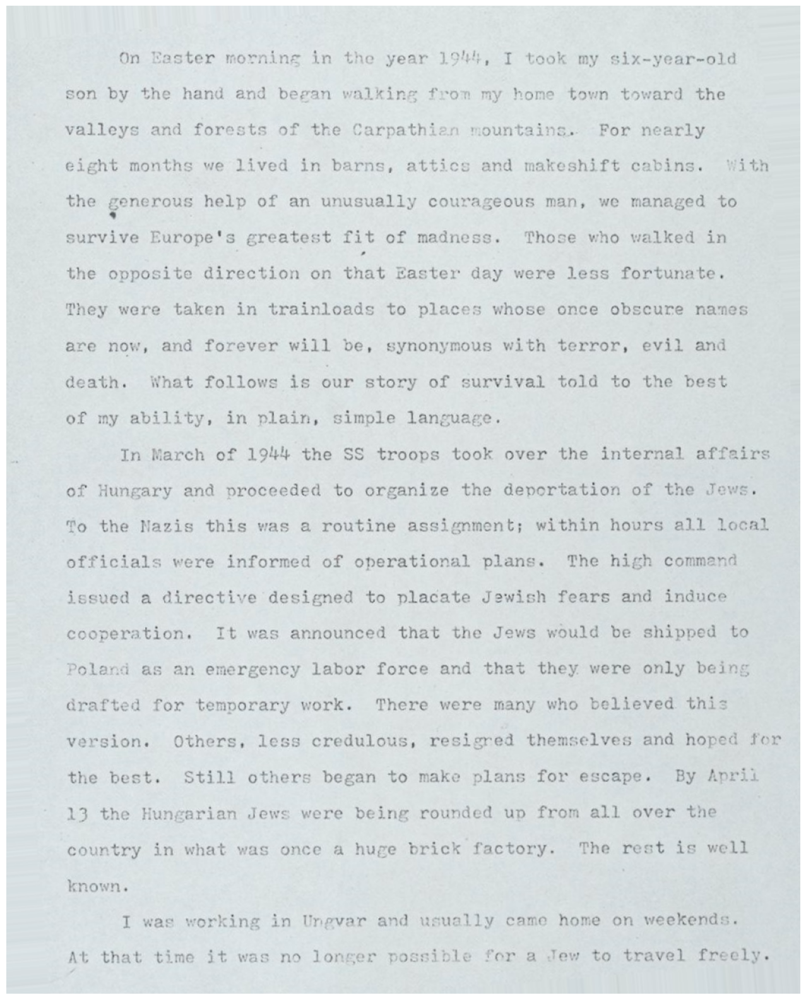

In [36]:
print(f"Angle: {angle}")
utils.display(fixed)

## Removing Borders

In [36]:
def remove_borders_simply(image):
    contours, hierarchy = cv2.findContours(
        image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
    )
    cntsSorted = sorted(contours, key=lambda x: cv2.contourArea(x))
    cnt = cntsSorted[-1]
    x, y, w, h = cv2.boundingRect(cnt)
    crop = image[y : y + h, x : x + w]
    return crop

In [101]:
def remove_borders(image):
    newImage = image.copy()
    gray = cv2.cvtColor(newImage, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (21, 21), 0)
    thresh = cv2.threshold(blur, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)[1]
    # Apply dilate to merge text into meaningful lines/paragraphs.
    # Use larger kernel on X axis to merge characters into single line, cancelling out any spaces.
    # But use smaller kernel on Y axis to separate between different blocks of text
    # kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (20, 20))
    # dilate = cv2.dilate(thresh, kernel, iterations=1)

    # Find all contours
    contours, hierarchy = cv2.findContours(
        thresh, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE
    )
    contours = sorted(contours, key=cv2.contourArea, reverse=True)
    if len(contours) > 1:
        cnt = contours[1]
        x, y, w, h = cv2.boundingRect(cnt)
        crop = image[y : y + h, x : x + w]
        return crop
    else:
        return image

In [102]:
IMAGE_FILE = "./assets/id_card_2.png"

img = cv2.imread(IMAGE_FILE)

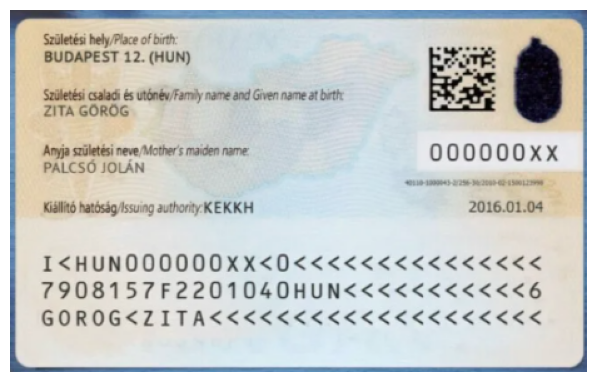

In [103]:
no_borders = remove_borders(img)
utils.display(no_borders)

## Add Borders

In [99]:
color = [255, 255, 255]
top, bottom, left, right = [150] * 4

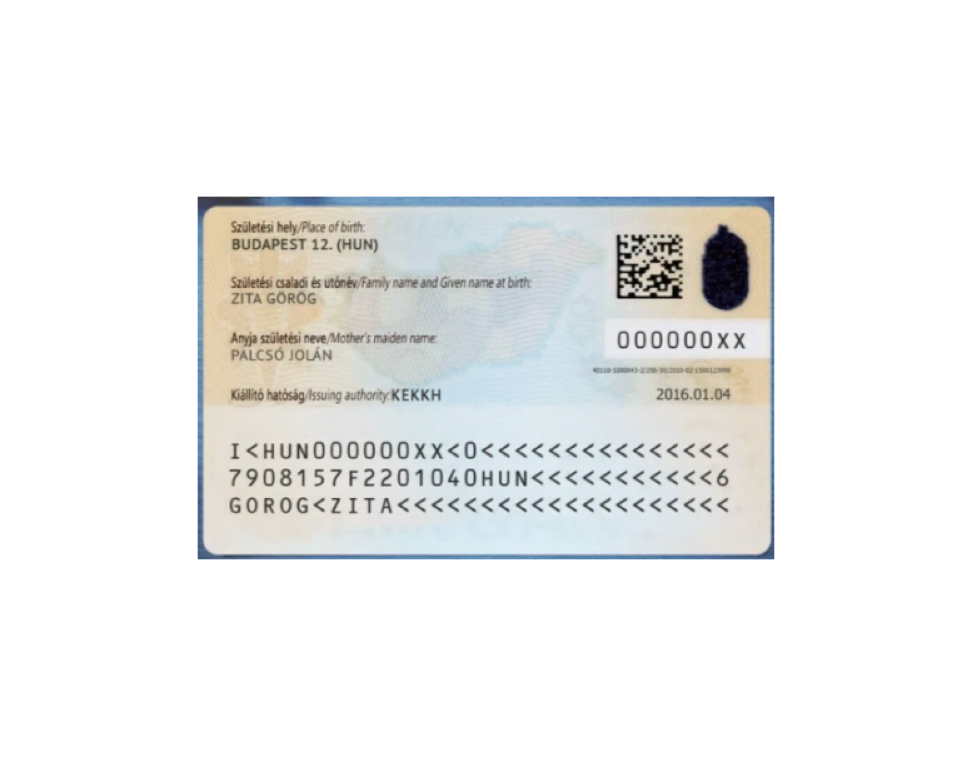

In [100]:
image_with_border = cv2.copyMakeBorder(
    no_borders, top, bottom, left, right, cv2.BORDER_CONSTANT, value=color
)

utils.display(image_with_border)